In [2]:
import numpy as np
import pandas as pd
import scipy.io

import matplotlib.pyplot as plt
import sys
sys.path.insert(0, '../')
from M1S_tools import *
import glob
import re

plt.set_cmap('jet')

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
## bending modes & influence matrices etc from Buddy #####################
ML actuators =  165 165
Afn =  (6991, 165)
fv =  (165, 165)
U matrix (6991, 165)
N node =  6991
## bending modes & influence matrices etc from Trupti #####################
N actuators =  170
/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents/influnce_matrix_files/OA_influence_matrices_all/OA_surface_normal_165SA_09Jan2025/
Afz =  (27547, 165)
U matrix (27547, 165)
S matrix (165, 165)

<Figure size 640x480 with 0 Axes>

In [3]:
_, filesetM = parse_ml_data_folder('%s/Sec 19 test/PVT test1/'%(ml_data_dir))

Thu Mar 06 09:11:05 2025 	 250306 GMT3 PVT zero av60 gmtMorph170614 -.h5
Thu Mar 06 09:41:52 2025 	 250306 GMT3 PVT zero 2 av60 gmtMorph170614 -.h5
Thu Mar 06 09:57:10 2025 	 250306 GMT3 PVT line 25000 av60 gmtMorph170614 -.h5
Thu Mar 06 10:00:06 2025 	 250306 GMT3 PVT line 26000 av60 gmtMorph170614 -.h5
Thu Mar 06 10:03:49 2025 	 250306 GMT3 PVT line 24000 av60 gmtMorph170614 -.h5


In [4]:
nMeasure = len(filesetM)
print(filesetM)
print(nMeasure)
dateID = filesetM[0].split('/')[-1][:6]
print(dateID)

['/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT zero av60 gmtMorph170614 -.h5'
 '/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT zero 2 av60 gmtMorph170614 -.h5'
 '/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 25000 av60 gmtMorph170614 -.h5'
 '/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 26000 av60 gmtMorph170614 -.h5'
 '/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 24000 av60 gmtMorph170614 -.h5']
5
250306


/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT zero av60 gmtMorph170614 -.h5: Thu Mar 06 09:11:05 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT zero 2 av60 gmtMorph170614 -.h5: Thu Mar 06 09:41:52 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 25000 av60 gmtMorph170614 -.h5: Thu Mar 06 09:57:10 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 26000 av60 gmtMorph170614 -.h5: Thu Mar 06 10:00:06 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 24000 av60 gmtMorph170614 -.h5: Thu Mar 06 10:03:49 2025 


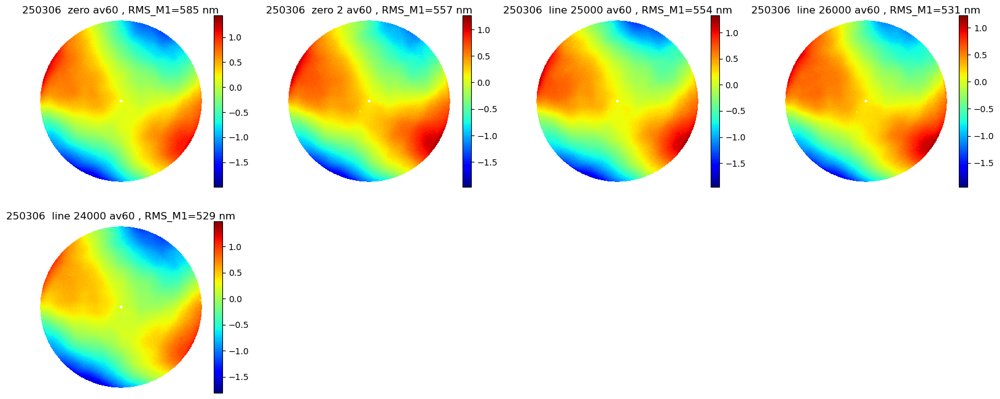

In [5]:
nrow = int(np.ceil(nMeasure/4.))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))

ts_array = []
for i in range(nMeasure):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    
    fileset = filesetM[i]
    if ~isinstance(fileset, list):
        fileset = [fileset]
    #print(glob_string, fileset)
    assert len(fileset)==1
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset)
    ts_array.append(ts)

    m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
    img = ax[irow][icol].imshow(m1s, origin='lower')
    fig.colorbar(img, ax=ax[irow][icol])
    aa = re.sub(r'^.*?PVT', '', re.sub(r'gmtMor.*$', '', fileset[0].split('/')[-1]))
    ax[irow][icol].set_title('%s %s, RMS_M1=%.0f nm'%(dateID, aa, m1rms))
for i in range(nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT zero av60 gmtMorph170614 -.h5: Thu Mar 06 09:11:05 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT zero 2 av60 gmtMorph170614 -.h5: Thu Mar 06 09:41:52 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 25000 av60 gmtMorph170614 -.h5: Thu Mar 06 09:57:10 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 26000 av60 gmtMorph170614 -.h5: Thu Mar 06 10:00:06 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test1/250306 GMT3 PVT line 24000 av60 gmtMorph170614 -.h5: Thu Mar 06 10:03:49 2025 


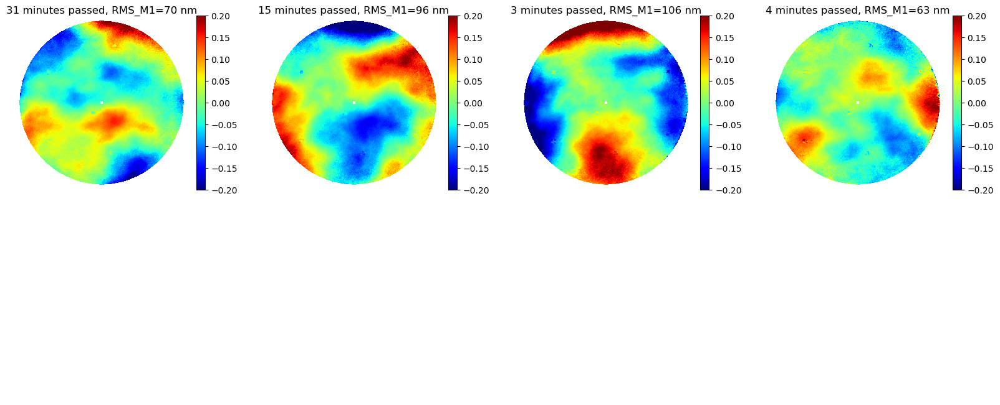

In [6]:
nrow = np.max((int(np.ceil(nMeasure/4.)),2))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))

ts_array = []
for i in range(nMeasure):
    
    fileset = filesetM[i]
    if ~isinstance(fileset, list):
        fileset = [fileset]
    #print(glob_string, fileset)
    assert len(fileset)==1
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset)
    ts_array.append(ts)
    if i==0:
        m1sPrev = m1s.copy()
    else:
        irow = np.int8((i-1)/4)
        icol = np.mod((i-1),4)
        
        temp = m1s.copy()
        m1s -= m1sPrev
        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
        img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-0.2, vmax=0.2)
        fig.colorbar(img, ax=ax[irow][icol])
        aa = (unix_ts(ts_array[i])-unix_ts(ts_array[i-1]))/60.
        ax[irow][icol].set_title('%.0f minutes passed, RMS_M1=%.0f nm'%(aa, m1rms))
        m1sPrev = temp
for i in range(nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

In [7]:
_, filesetM = parse_ml_data_folder('%s/Sec 19 test/PVT test2/'%(ml_data_dir))

Fri Mar 07 10:55:13 2025 	 250307 GMT3 PVT zero av60 gmtMorph170614 -.h5
Fri Mar 07 10:59:50 2025 	 250307 GMT3 PVT start av60 gmtMorph170614 -.h5
Fri Mar 07 11:03:48 2025 	 250307 GMT3 PVT stop av60 gmtMorph170614 -.h5


In [8]:
nMeasure = len(filesetM)
print(filesetM)
print(nMeasure)
dateID = filesetM[0].split('/')[-1][:6]
print(dateID)

['/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT zero av60 gmtMorph170614 -.h5'
 '/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT start av60 gmtMorph170614 -.h5'
 '/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT stop av60 gmtMorph170614 -.h5']
3
250307


/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT zero av60 gmtMorph170614 -.h5: Fri Mar 07 10:55:13 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT start av60 gmtMorph170614 -.h5: Fri Mar 07 10:59:50 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT stop av60 gmtMorph170614 -.h5: Fri Mar 07 11:03:48 2025 


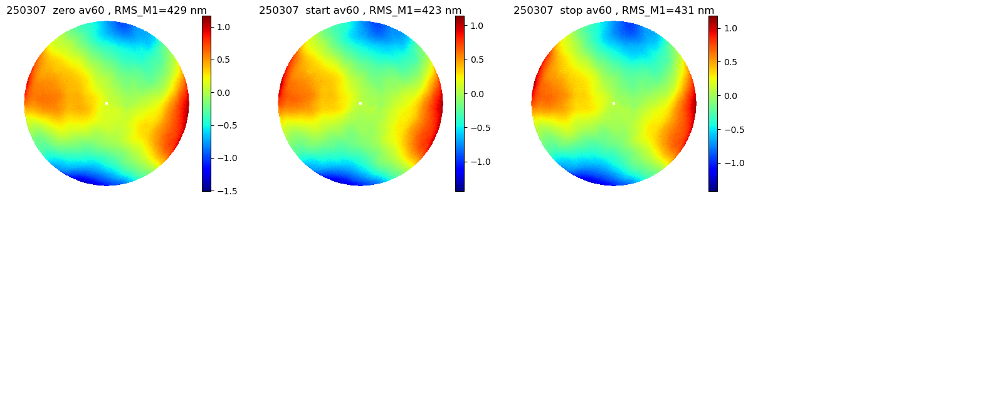

In [9]:
nrow = np.max((int(np.ceil(nMeasure/4.)),2))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))

ts_array = []
for i in range(nMeasure):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    
    fileset = filesetM[i]
    if ~isinstance(fileset, list):
        fileset = [fileset]
    #print(glob_string, fileset)
    assert len(fileset)==1
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset)
    ts_array.append(ts)

    m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
    img = ax[irow][icol].imshow(m1s, origin='lower')
    fig.colorbar(img, ax=ax[irow][icol])
    aa = re.sub(r'^.*?3 PVT', '', re.sub(r'gmtMor.*$', '', fileset[0].split('/')[-1]))
    ax[irow][icol].set_title('%s %s, RMS_M1=%.0f nm'%(dateID, aa, m1rms))
for i in range(nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT zero av60 gmtMorph170614 -.h5: Fri Mar 07 10:55:13 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT start av60 gmtMorph170614 -.h5: Fri Mar 07 10:59:50 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19 test/PVT test2/250307 GMT3 PVT stop av60 gmtMorph170614 -.h5: Fri Mar 07 11:03:48 2025 


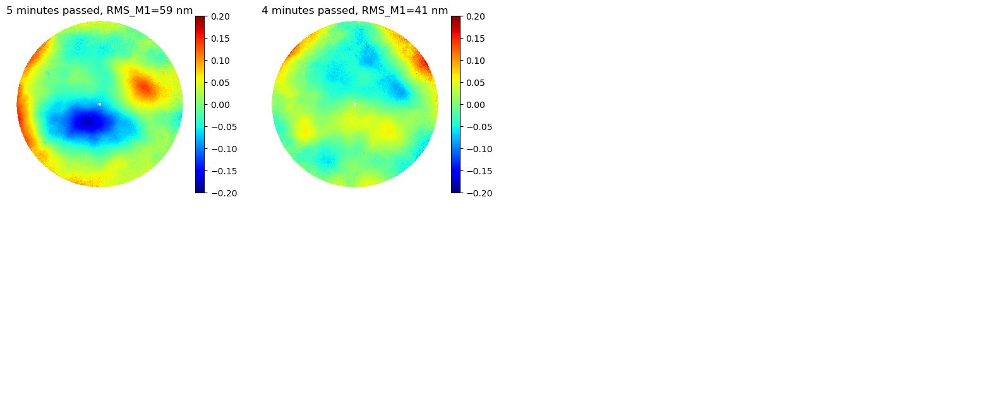

In [10]:
nrow = np.max((int(np.ceil(nMeasure/4.)),2))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))

ts_array = []
for i in range(nMeasure):
    
    fileset = filesetM[i]
    if ~isinstance(fileset, list):
        fileset = [fileset]
    #print(glob_string, fileset)
    assert len(fileset)==1
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset)
    ts_array.append(ts)
    if i==0:
        m1sPrev = m1s.copy()
    else:
        irow = np.int8((i-1)/4)
        icol = np.mod((i-1),4)
        
        temp = m1s.copy()
        m1s -= m1sPrev
        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
        img = ax[irow][icol].imshow(m1s, origin='lower', vmin=-0.2, vmax=0.2)
        fig.colorbar(img, ax=ax[irow][icol])
        aa = (unix_ts(ts_array[i])-unix_ts(ts_array[i-1]))/60.
        ax[irow][icol].set_title('%.0f minutes passed, RMS_M1=%.0f nm'%(aa, m1rms))
        m1sPrev = temp
for i in range(nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

# Actual Test

In [68]:
Rz = 'PVT-'
#Rz = 'PVT+'

In [69]:
_, filesetM = parse_ml_data_folder('%s/Sec 19/%s/'%(ml_data_dir, Rz))

Tue Mar 11 13:02:02 2025 	 250311 GMT3 set1 19.2 4 initial gmtMorph170614 -.h5
Tue Mar 11 13:08:04 2025 	 250311 GMT3 set1 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:11:21 2025 	 250311 GMT3 set2 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:14:39 2025 	 250311 GMT3 set3 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:17:57 2025 	 250311 GMT3 set4 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:21:14 2025 	 250311 GMT3 set5 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:24:32 2025 	 250311 GMT3 set6 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:27:50 2025 	 250311 GMT3 set7 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:31:08 2025 	 250311 GMT3 set8 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:35:12 2025 	 250311 GMT3 set9 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:38:30 2025 	 250311 GMT3 set10 19.2 5-12 Cell minus dir gmtMorph170614 -.h5
Tue Mar 11 13:41:48 2025 	 250

In [70]:
nMeasure = len(filesetM)
#print(filesetM)
print(nMeasure)
dateID = filesetM[0].split('/')[-1][:6]
print(dateID)

26
250311


/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set1 19.2 4 initial gmtMorph170614 -.h5: Tue Mar 11 13:02:02 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set1 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:08:04 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set2 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:11:21 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set3 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:14:39 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set4 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:17:57 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set5 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:21:14 2025 
/Users/bxin/GMT_docs/1_M1/Analys

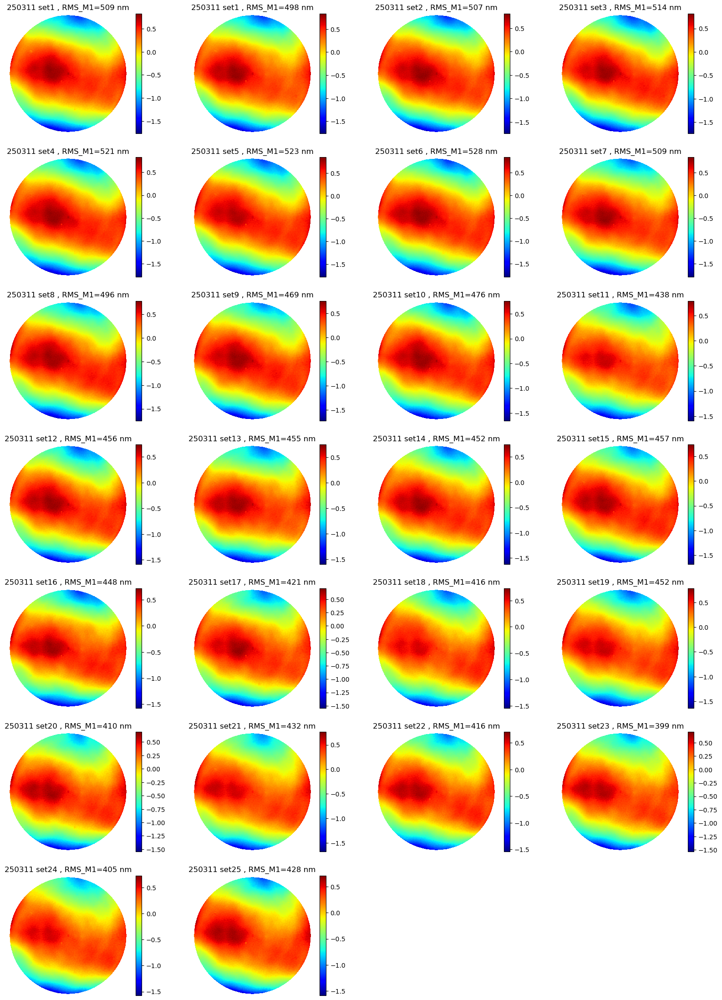

In [71]:
nrow = np.max((int(np.ceil(nMeasure/4.)),2))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))

ts_array = []
for i in range(nMeasure):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    
    fileset = filesetM[i]
    if ~isinstance(fileset, list):
        fileset = [fileset]
    #print(glob_string, fileset)
    assert len(fileset)==1
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset)
    ts_array.append(ts)

    m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
    img = ax[irow][icol].imshow(m1s, origin='lower')
    fig.colorbar(img, ax=ax[irow][icol])
    aa = re.sub(r'^.*?GMT3 ', '', re.sub(r'19.2.*$', '', fileset[0].split('/')[-1]))
    ax[irow][icol].set_title('%s %s, RMS_M1=%.0f nm'%(dateID, aa, m1rms))
for i in range(nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set1 19.2 4 initial gmtMorph170614 -.h5: Tue Mar 11 13:02:02 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set1 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:08:04 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set2 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:11:21 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set3 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:14:39 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set4 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:17:57 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 19/PVT-/250311 GMT3 set5 19.2 5-12 Cell minus dir gmtMorph170614 -.h5: Tue Mar 11 13:21:14 2025 
/Users/bxin/GMT_docs/1_M1/Analys

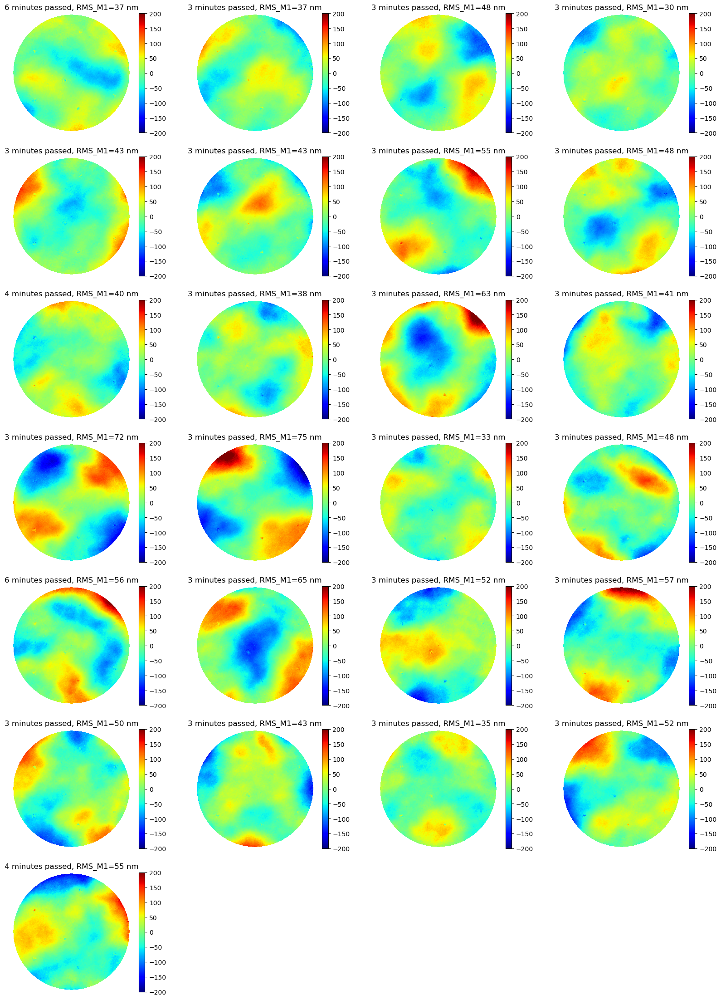

In [72]:
nrow = np.max((int(np.ceil(nMeasure/4.)),2))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))

ts_array = []
for i in range(nMeasure):
    
    fileset = filesetM[i]
    if ~isinstance(fileset, list):
        fileset = [fileset]
    #print(glob_string, fileset)
    assert len(fileset)==1
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset)
    ts_array.append(ts)
    if i==0:
        m1sPrev = m1s.copy()
    else:
        irow = np.int8((i-1)/4)
        icol = np.mod((i-1),4)
        
        temp = m1s.copy()
        m1s -= m1sPrev
        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
        img = ax[irow][icol].imshow(m1s*1000, origin='lower', vmin=-200, vmax=200)
        fig.colorbar(img, ax=ax[irow][icol])
        aa = (unix_ts(ts_array[i])-unix_ts(ts_array[i-1]))/60.
        ax[irow][icol].set_title('%.0f minutes passed, RMS_M1=%.0f nm'%(aa, m1rms))
        m1sPrev = temp
for i in range(nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

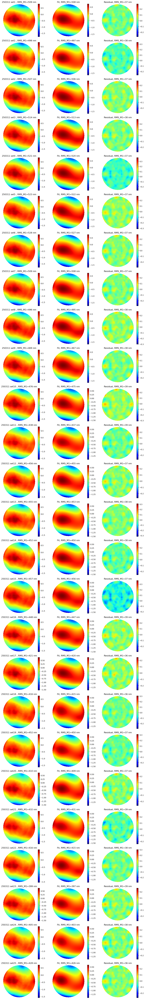

In [73]:
nzer = 37
zercoeff = np.zeros((nMeasure, nzer))

[x1, y1] = mkXYGrid(m1s, centerRow, centerCol, pixelSize)
r1 = np.sqrt(x1**2 + y1**2)

nnodes = x1.shape[0]*x1.shape[1]
zerU = np.zeros((nnodes, nzer))
for i in range(nzer):
    zerU[:,i] = zernike_polynomial(i+1, x1/radius_of_CA, y1/radius_of_CA).flatten()

nrow = nMeasure
fig, ax = plt.subplots(nrow,3,figsize=(12,3*nrow))
ts_array = []
for i in range(nMeasure):
    irow = i
    #print(irow, icol)
    fileset = filesetM[i]
    if ~isinstance(fileset, list):
        fileset = [fileset]
    #print(glob_string, fileset)
    assert len(fileset)==1
    
    m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset, verbose=False)
    ts_array.append(ts)

    m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
    icol = 0
    img = ax[irow][icol].imshow(m1s, origin='lower')
    fig.colorbar(img, ax=ax[irow][icol])
    aa = re.sub(r'^.*?GMT3 ', '', re.sub(r'19.2.*$', '', fileset[0].split('/')[-1]))
    ax[irow][icol].set_title('%s %s, RMS_M1=%.0f nm'%(dateID,aa, m1rms))

    icol = 1
    maskNew = (~np.isnan(m1s) ) & (r1<radius_of_CA)
    nnodesNew = np.sum(maskNew)
    zercoeff[i,:] = zerU[maskNew.flatten(),:].transpose() / nnodesNew @ m1s[maskNew]
    recon = np.zeros_like(m1s)
    recon[~maskNew] = np.nan
    for k in range(nzer):
        recon[maskNew] += zercoeff[i,k]*zerU[maskNew.flatten(),k]  
    img = ax[irow][icol].imshow(recon, origin='lower')          
    fig.colorbar(img, ax=ax[irow][icol])
    m1rms = np.std(recon[~np.isnan(recon)])*1000 #convert into nm
    ax[irow][icol].set_title('Fit, RMS_M1=%.0f nm'%(m1rms))

    icol = 2
    resi = m1s - recon
    img = ax[irow][icol].imshow(resi, origin='lower')
    fig.colorbar(img, ax=ax[irow][icol])        
    m1rms = np.std(resi[~np.isnan(resi)])*1000 #convert into nm
    ax[irow][icol].set_title('Residual, RMS_M1=%.0f nm'%(m1rms))        
for i in range(nrow*3):
    irow = np.int8(i/3)
    icol = np.mod(i,3)
    ax[irow][icol].axis('off')    
plt.tight_layout()

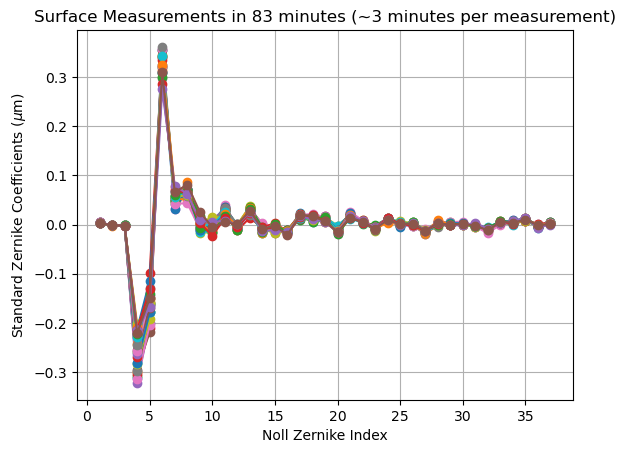

In [74]:
plt.plot(np.arange(1, nzer+1), zercoeff.T,'-o')
plt.ylabel(r'Standard Zernike Coefficients ($\mu$m)')
plt.xlabel('Noll Zernike Index')
plt.title('Surface Measurements in 83 minutes (~3 minutes per measurement)')
plt.grid();

In [75]:
ntsamples = 100
start_time = unix_ts(ts_array[0])-60*1 - 60 #1 minute before starting the first measurement
end_time = unix_ts(ts_array[-1])+60*8 #5 minute after the last measurement

# get TC data
tc, tt = getDBData(start_time,'m1_s1_thermal_ctrl/i/tc_temperature/value', 
                   duration_in_s=end_time-start_time, samples=ntsamples)
tambient, tt = getDBData(start_time,'m1_s1_thermal_ctrl/i/ambient_temperature/value', 
                         duration_in_s=end_time-start_time, samples=ntsamples)
#get continuous mirror positions
mirror_pos_ntsamples, tt = getDBData(start_time,'m1_s1_support_ctrl/s/mirror_position/value', 
                                   duration_in_s=end_time-start_time, samples=ntsamples)
#get continuous bending forces, but these are all ZEROs
bend_force_ntsamples, tt = getDBData(start_time,'m1_s1_support_ctrl/s/sa_bending_force/value', 
                           duration_in_s=end_time-start_time, samples=ntsamples)
bend_force_z_ntsamples = bend_force_ntsamples[:,:,2]

sa_force, tt = getDBData(start_time,'m1_s1_support_ctrl/s/sa_force/value', 
                         duration_in_s=end_time-start_time, samples=ntsamples)
sa_support_force, tt = getDBData(start_time,'m1_s1_support_ctrl/s/sa_support_force/value', 
                                 duration_in_s=end_time-start_time, samples=ntsamples)
g_load, tt = getDBData(start_time,'m1_s1_support_ctrl/s/gravity_load/value', 
                       duration_in_s=end_time-start_time, samples=ntsamples)
ofl6, tt = getDBData(start_time,'m1_s1_support_ctrl/s/ofl_correction/value', 
                     duration_in_s=end_time-start_time, samples=ntsamples)

m1_s1_thermal_ctrl/i/tc_temperature/value
2025-03-11 13:00:02  duration =  5982  s
(100, 192)
m1_s1_thermal_ctrl/i/ambient_temperature/value
2025-03-11 13:00:02  duration =  5982  s
(100,)
m1_s1_support_ctrl/s/mirror_position/value
2025-03-11 13:00:02  duration =  5982  s
(100, 6)
m1_s1_support_ctrl/s/sa_bending_force/value
2025-03-11 13:00:02  duration =  5982  s
(100, 170, 3)
m1_s1_support_ctrl/s/sa_force/value
2025-03-11 13:00:02  duration =  5982  s
(100, 170, 3)
m1_s1_support_ctrl/s/sa_support_force/value
2025-03-11 13:00:02  duration =  5982  s
(100, 170, 3)
m1_s1_support_ctrl/s/gravity_load/value
2025-03-11 13:00:02  duration =  5982  s
(100, 6)
m1_s1_support_ctrl/s/ofl_correction/value
2025-03-11 13:00:02  duration =  5982  s
(100, 6)


### Let's examine what forces are worth plotting

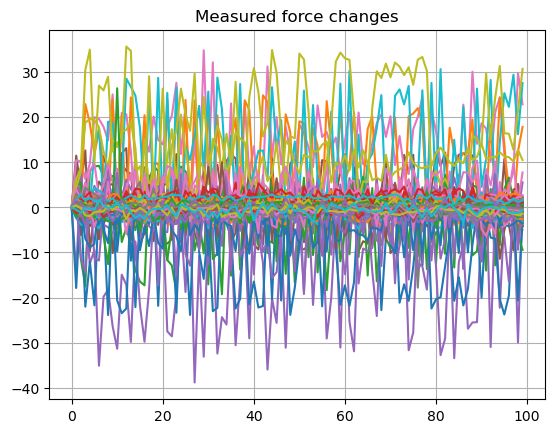

In [76]:
for i in range(170):
    aa = sa_force[:,i,2]-sa_force[0,i,2]
    
    plt.plot(aa)
plt.title('Measured force changes')
plt.grid();

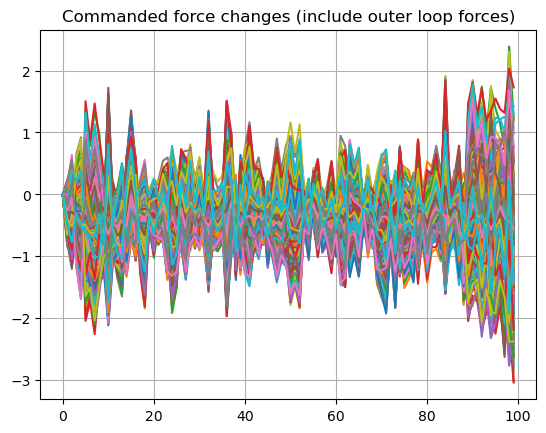

In [77]:
for i in range(170):
    aa = sa_support_force[:,i,2]-sa_support_force[0,i,2]
    plt.plot(aa)
plt.title('Commanded force changes (include outer loop forces)')
plt.grid();
#offset forces do not change; bending forces do not change

In [78]:
import re
ctrlFolder = '/Users/bxin/gmt_local/modules/ocs_m1_dcs/src/etc/conf/m1_support_pkg/common/'
#FB_K_file = 'm1_sa_figure_force_offset_conf.coffee'
FB_K_file = 'm1_sa_figure_force_offset_polishing_and_sa_load_conf.coffee'
filename = os.path.join(ctrlFolder, FB_K_file)

fid = open(filename)
offsets = np.zeros((170, 3))
i = 0
for line in fid:
    if len(line)>20 and not re.match(r"#", line):
        a = re.split('\[|]|,',line)
        a = [x for x in a if (x and not x.isspace() and x!='\n')]
        #print(a)
        offsets[i,:] = a[:3]
        i += 1

In [79]:
offsets.shape, np.sum(offsets[:,2])

((170, 3), -4540.05)

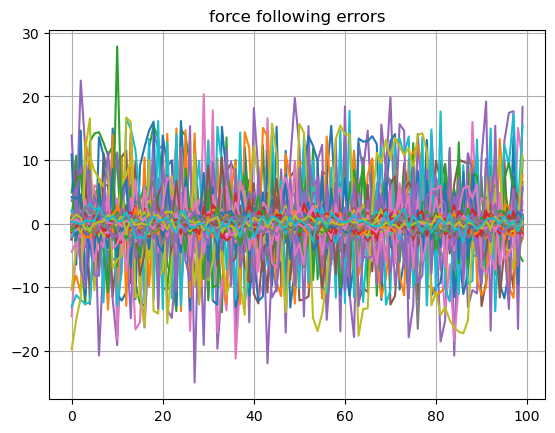

In [80]:
for i in range(170):
    #sa_force is measured force; 
    #commanded force can be obtained by sa_support_force + sa_bend_force. bend forces are all Zeros.
    aa = sa_force[:,i,2]-sa_support_force[:,i,2] - offsets[i,2]
    plt.plot(aa);
plt.title('force following errors')
plt.grid();

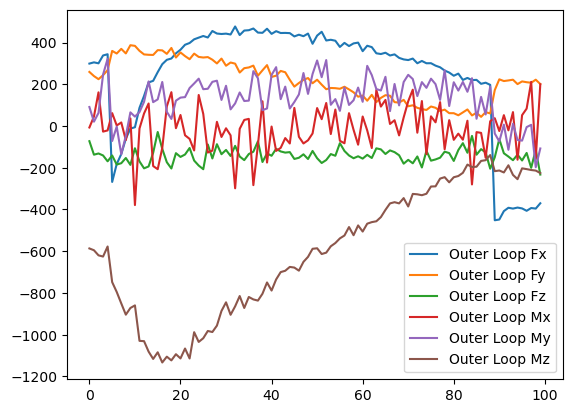

In [81]:
for i, slabel in enumerate(['Fx', 'Fy', 'Fz', 'Mx', 'My', 'Mz']):
    plt.plot(ofl6[:,i], label='Outer Loop '+slabel);
plt.legend();

In [82]:
g_load[:3,:]

array([[ 1.94337976e-11,  0.00000000e+00, -1.58689000e+05,
         0.00000000e+00, -4.60189995e-12,  0.00000000e+00],
       [ 1.94337976e-11,  0.00000000e+00, -1.58689000e+05,
         0.00000000e+00, -4.60189995e-12,  0.00000000e+00],
       [ 1.94337976e-11,  0.00000000e+00, -1.58689000e+05,
         0.00000000e+00, -4.60189995e-12,  0.00000000e+00]])

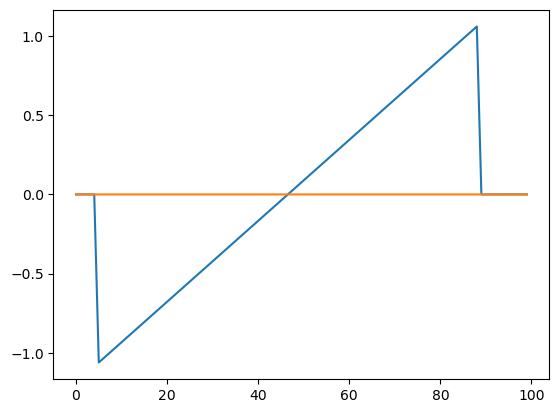

In [83]:
for i in range(2):
    aa = mirror_pos_ntsamples[:,i] -mirror_pos_ntsamples[0,i]
    plt.plot(aa*1e3)

In [84]:
mirror_pos_ntsamples[:,1]

array([0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000115,
       0.000115, 0.000115, 0.000115, 0.000115, 0.000115, 0.000

In [85]:
bend_force_ntsamples[:,:,2].shape

(100, 170)

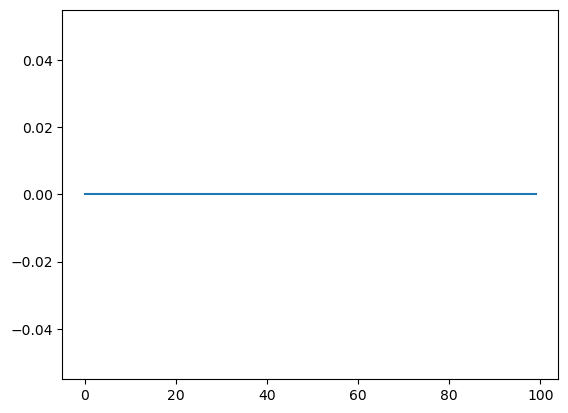

In [86]:
plt.plot(bend_force_ntsamples[:,0,0])

In [87]:
# Compute elapsed time in minutes from t0
t0 = tt[0]  # Start time (first timestamp)
tt_minutes = (tt - t0) / 60  # Convert to minutes
ts_minutes = ([unix_ts(t) for t in ts_array] - t0) / 60  # Convert ts_array to minutes

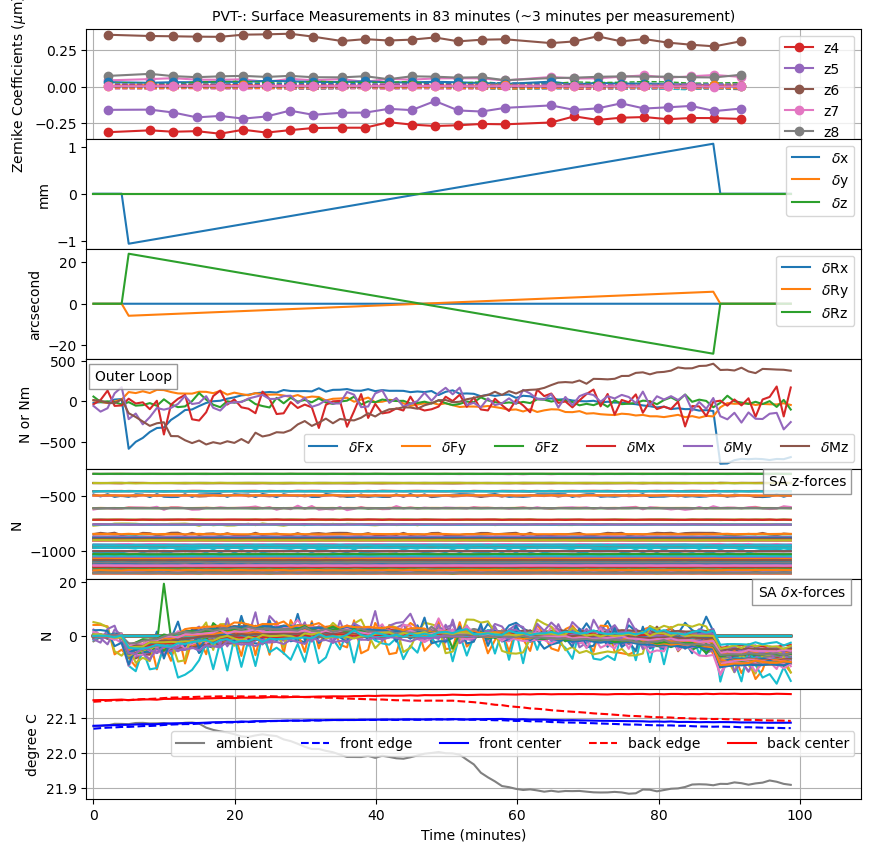

In [89]:
fig, ax = plt.subplots(7,1,figsize=(10,10), sharex=True)
for i in range(nzer):
    if (i+1) in [4,5,6,7,8,11,22,37]:
        ax[0].plot(ts_minutes, zercoeff[:,i],'-o',label='z%d'%(i+1))
    else:
        ax[0].plot(ts_minutes, zercoeff[:,i],'--', linewidth=1)
ax[0].set_ylabel(r'Zernike Coefficients ($\mu$m)')
ax[0].set_title('%s: Surface Measurements in 83 minutes (~3 minutes per measurement)'%Rz, fontsize=10)
                #fontfamily="sans-serif")#Times New Roman")
ax[0].legend(loc='upper right')
ax[0].grid()

i=1
for idof, slabel in enumerate(['x','y','z']):
    aa = mirror_pos_ntsamples[:,idof] - np.mean(mirror_pos_ntsamples[:5,idof])
    ax[i].plot(tt_minutes, aa*1e3, label=r'$\delta$%s'%slabel) #now in mm
ax[i].legend()
ax[i].set_ylabel('mm')

i = 2
for idof, slabel in enumerate(['Rx','Ry','Rz']):
    aa = mirror_pos_ntsamples[:,idof+3] - np.mean(mirror_pos_ntsamples[:5,idof+3])
    ax[i].plot(tt_minutes, aa*rad2arcsec, label=r'$\delta$%s'%slabel) #now in arcsec
ax[i].legend()
ax[i].set_ylabel('arcsecond')

i=3
for ii, slabel in enumerate(['Fx', 'Fy', 'Fz', 'Mx', 'My', 'Mz']):
    aa = ofl6[:,ii] - np.mean(ofl6[:5,ii])
    ax[i].plot(tt_minutes, aa, label=r'$\delta$%s'%slabel)
ax[i].legend(ncol=6, loc='lower right')
if Rz == 'PVT+':
    ax[i].legend(ncol=6, loc='upper right')
ax[i].text(0.11, 0.9, "Outer Loop",
        transform=ax[i].transAxes,  # Coordinates relative to the axes (0 to 1)
        fontsize=10, color="black",
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(facecolor='white', edgecolor='grey', alpha=0.8))    
ax[i].set_ylabel('N or Nm')

i=4
ax[i].plot(tt_minutes, sa_force[:,:,2])
ax[i].set_ylabel('N')
ax[i].text(0.98, 0.95, "SA z-forces",
        transform=ax[i].transAxes,  # Coordinates relative to the axes (0 to 1)
        fontsize=10, color="black",
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(facecolor='white', edgecolor='grey', alpha=0.8))
i=5
for ii in range(nact):
    aa = sa_force[:,ii,0] - np.mean(sa_force[:5,ii,0])
    ax[i].plot(tt_minutes, aa)
ax[i].set_ylabel('N')
ax[i].text(0.98, 0.95, r"SA $\delta $x-forces",
        transform=ax[i].transAxes,  # Coordinates relative to the axes (0 to 1)
        fontsize=10, color="black",
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(facecolor='white', edgecolor='grey', alpha=0.8))
i = 6
ax[i].plot(tt_minutes, tambient, 'grey', label='ambient')
ax[i].plot(tt_minutes, np.mean(tc[:,idx_mirror_f][:,idxfo], axis=1), '--b', label='front edge')
ax[i].plot(tt_minutes, np.mean(tc[:,idx_mirror_f][:,idxfi], axis=1), '-b', label='front center')
ax[i].plot(tt_minutes, np.mean(tc[:,idx_mirror_b][:,idxbo], axis=1), '--r', label='back edge')
ax[i].plot(tt_minutes, np.mean(tc[:,idx_mirror_b][:,idxbi], axis=1), '-r', label='back center')
ax[i].legend(ncol=5) #, framealpha=0.7)
ax[i].set_xlabel('Time (minutes)')
ax[i].set_ylabel('degree C')
ax[i].grid()
ax[i].set_xlabel('Time (minutes)')
ax[i].set_xlim([-1, tt_minutes[-1]+10])
plt.subplots_adjust(hspace=0)